**Author: Yifang Cheng [Link](https://sites.google.com/view/yifangcheng)**

## 1. Introduction

## 1.1 Historical development of earthquake mechanics

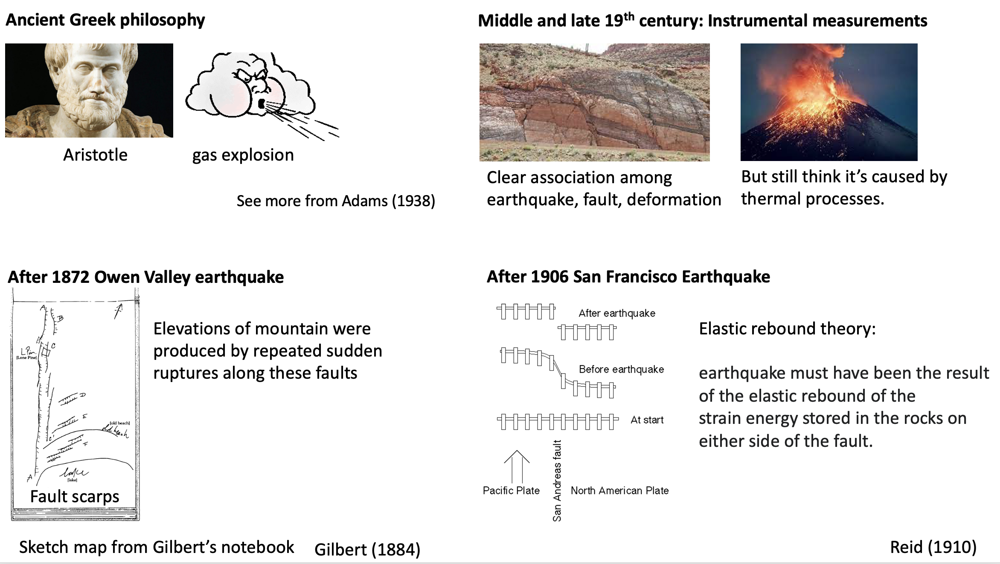

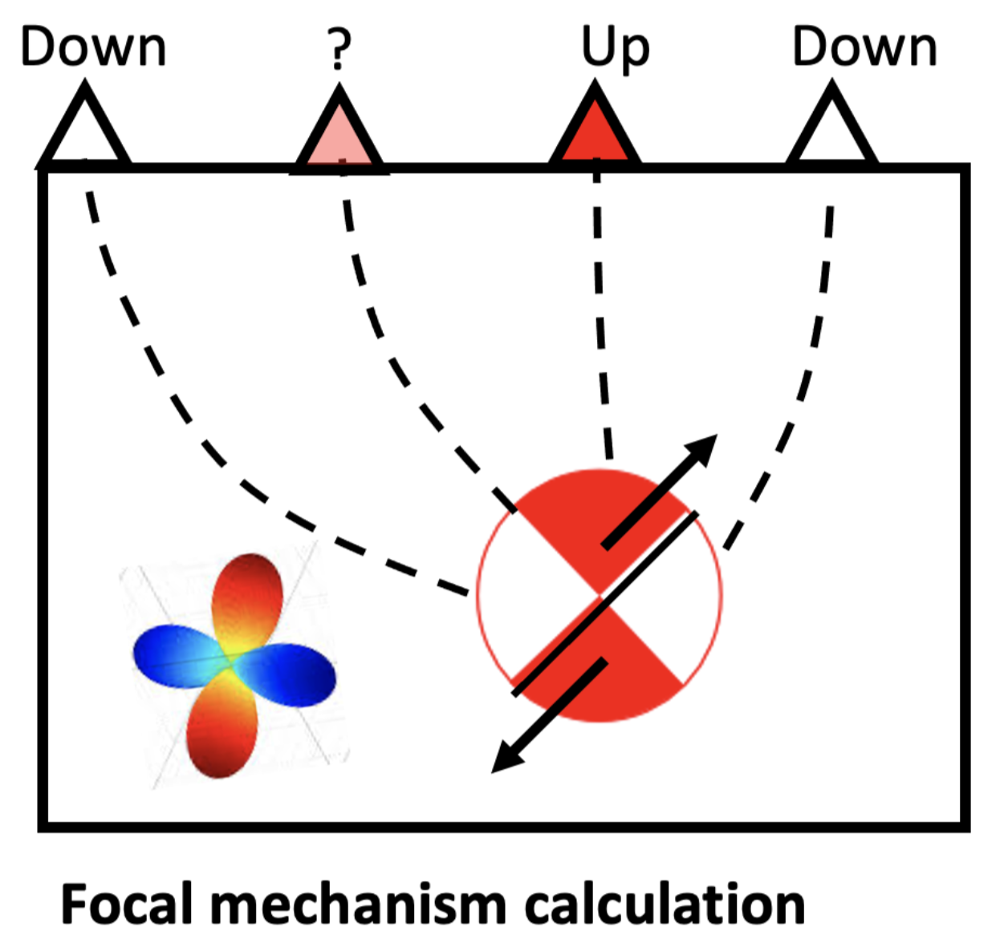

## 1.2 What is moment tensor?

> **Momentum equation for an elastic continuum**

\begin{equation}
\rho \frac{\partial^2 u_i}{\partial t^2} = {\partial_j \tau_{ij}} + f_i
\end{equation}


𝜌: density

𝑢: displacement

𝜏: stress tensor

𝑓: body force term

If we only concentrate on the force term, we can solve this linear, time-invariant differential equation using convolution:


\begin{equation}
u_i(x, t) = G_{ij}(x, t; x_0, t_0)f_j(x_0, t_0)
\end{equation}

𝐺: elastodynamic Green's function.
𝑢: displacement at location x and time t
𝑓: force at location 𝑥0 and 𝑡0

Because it is linear, the displacement from any body-force distribution can be computed as the sum of individual point sources.

> **Force couple and double couple**

Since an earthquake is usually modeled as slip on a fault, which has the slip distribution equivalent to that generated by two force vectors of magnitude *f*, pointing to opposite directions, separated by a distance *d* (force couple).

To balance the angular momentum, a complementary couple is used. (double couple)





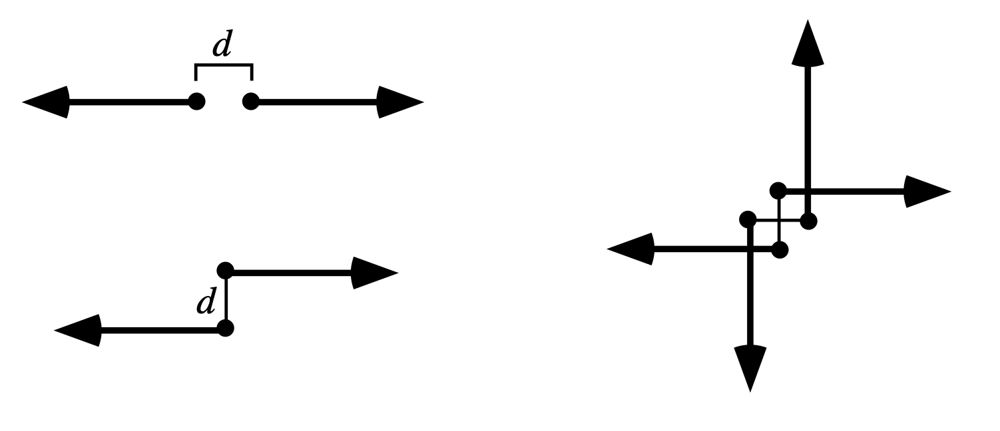




> **Stress tensor** versus **moment tensor**

* **stress tensor** describes the state of stress at a particular
point.

* **moment tensor** describes the force (caused by deformation) at the source location that generates seismic waves.

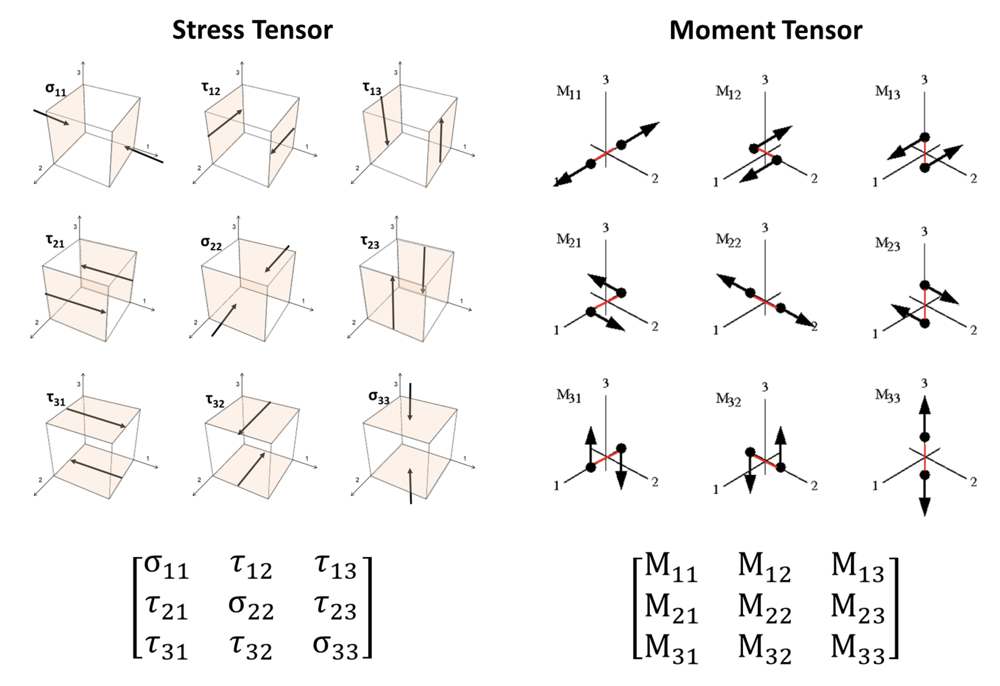

\begin{equation}
u_i(x, t) = \frac{\partial G_{ij}(x, t; x_0, t_0)} {\partial {(x_0)}_k}M_{jk}(x_0, t_0)
\end{equation}

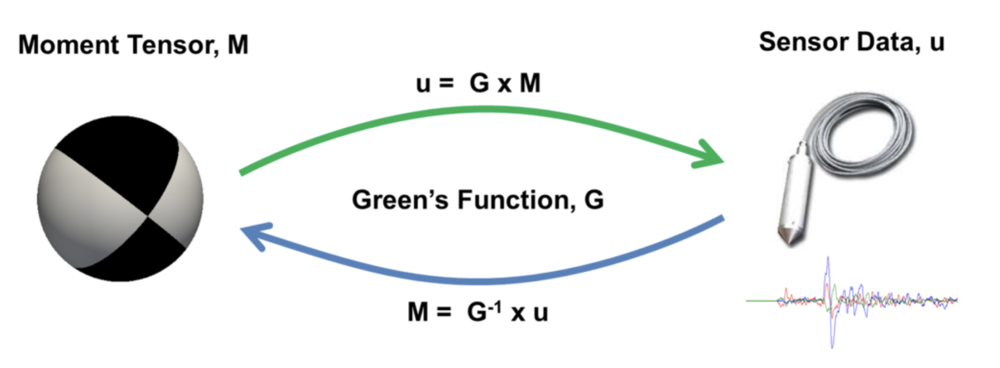

**Different type of moment tensors**

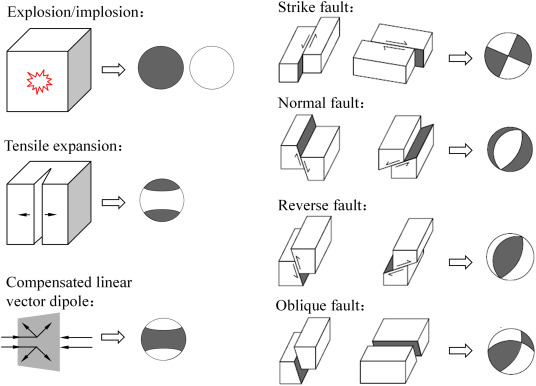

## 1.3 What is focal mechanism?
**Focal mechanism:** Fault orientation and slip direction on which the earthquake occurred

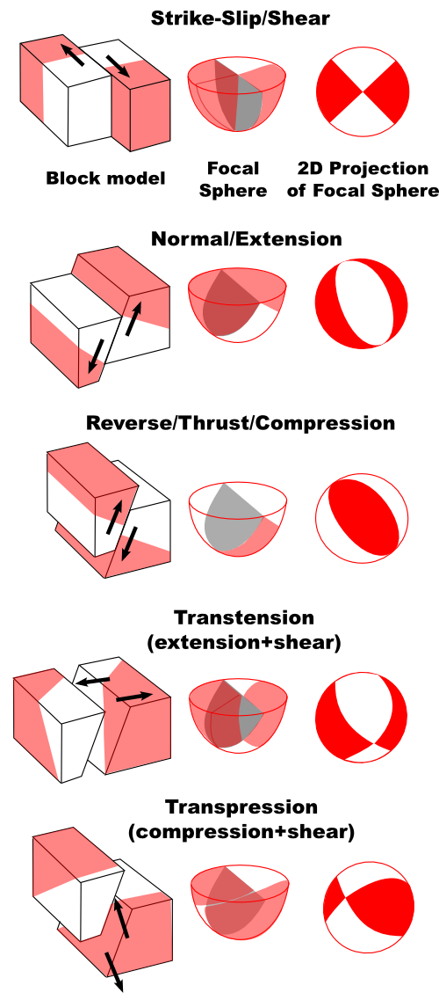

## 1.4 Why moment tensor and focal mechanism is important?

**From seismology to rock mechanics and structural geology**

### 1.3.1 Fault orientation

example from https://www.globalcmt.org/

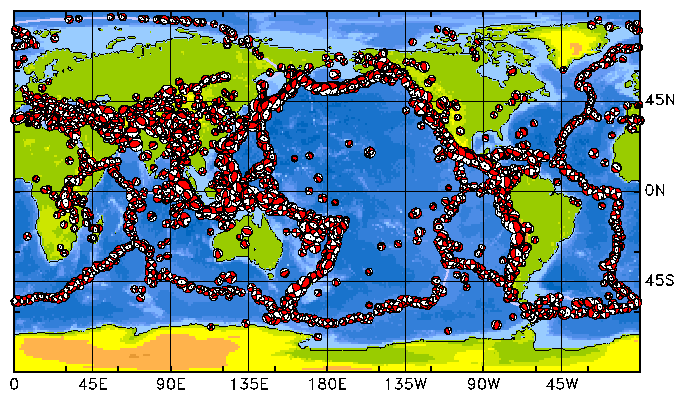

examples from Scholz, C. H. (2019). The mechanics of earthquakes and faulting. Cambridge university press.

**Large earthquake focal mechanisms** --> Main fault and large-scale tectonic motions

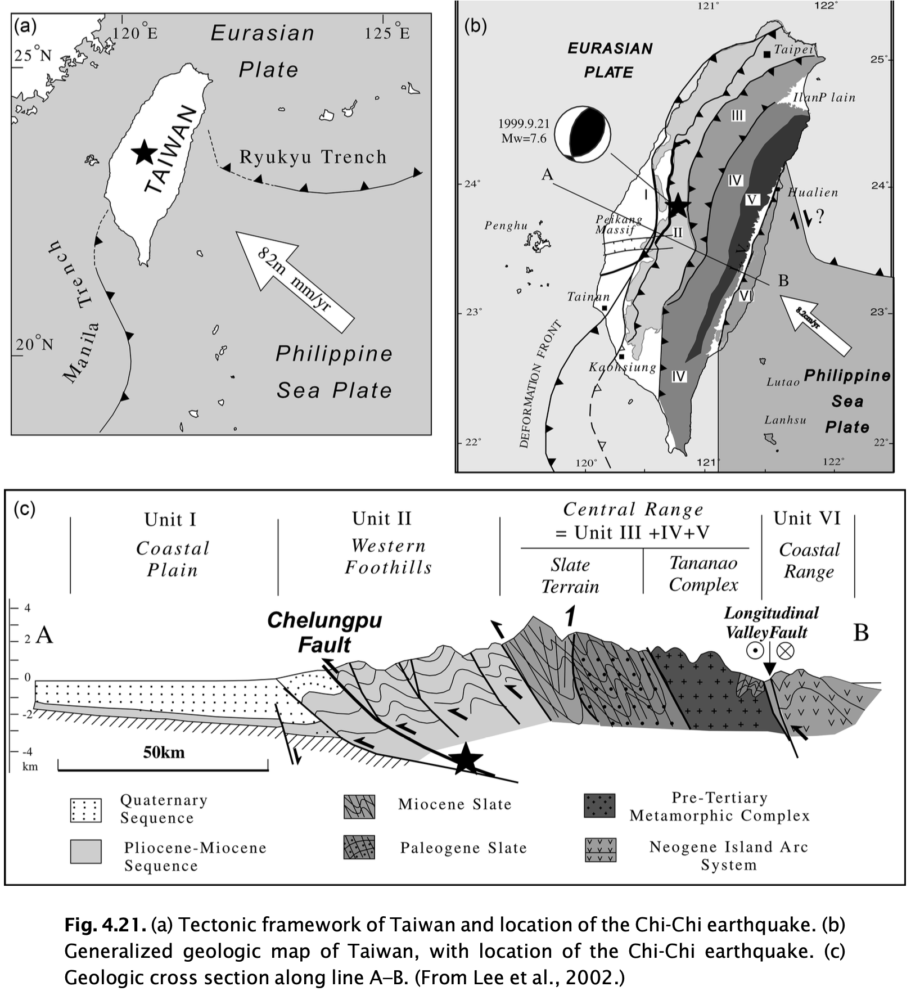

**Small earthquake focal mechanisms** --> local fault structures

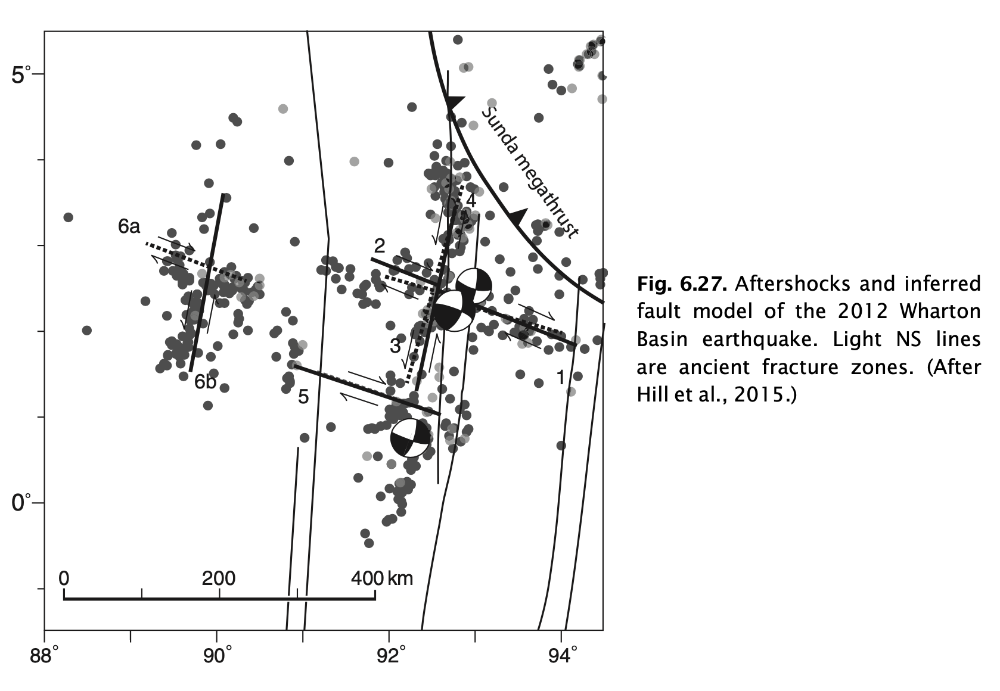

### 1.3.2 Slip direction

**For large fault with varying creep rate**

using known fault orientation and focal mechanism to solve slip direction

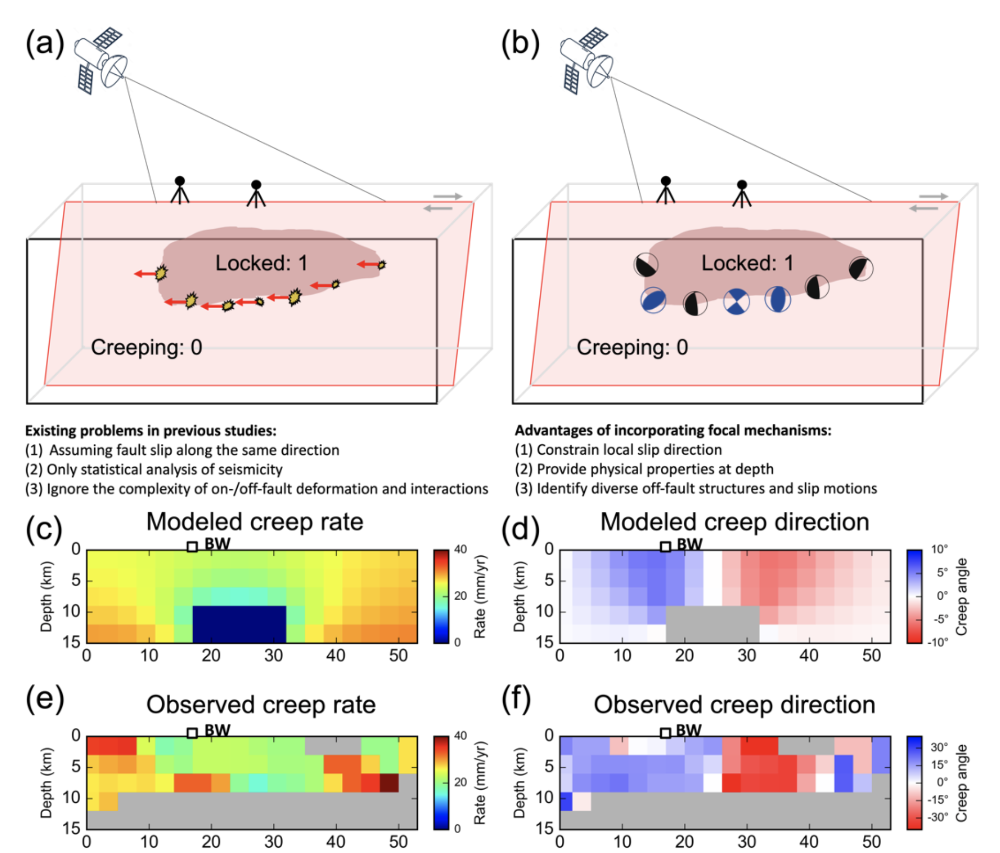

**For small single earthquakes**

Combine rupture directivity to find the fault orientation and slip direction


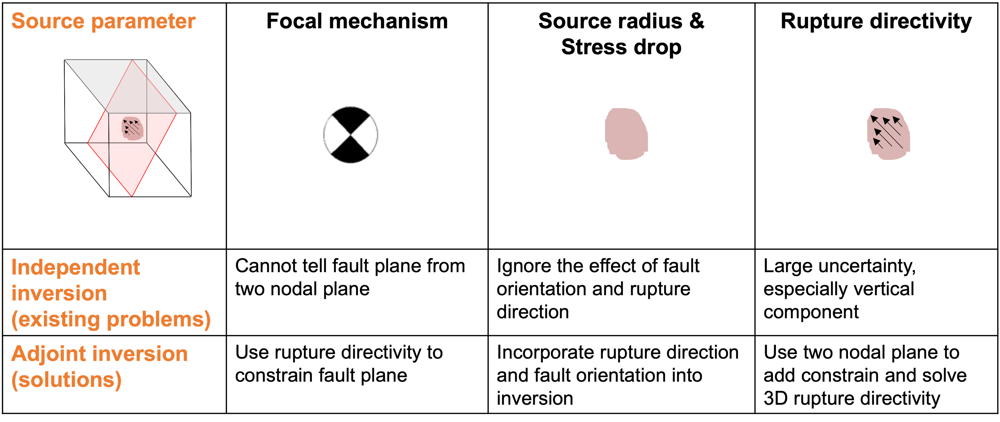

### 1.3.3 Stress orientation

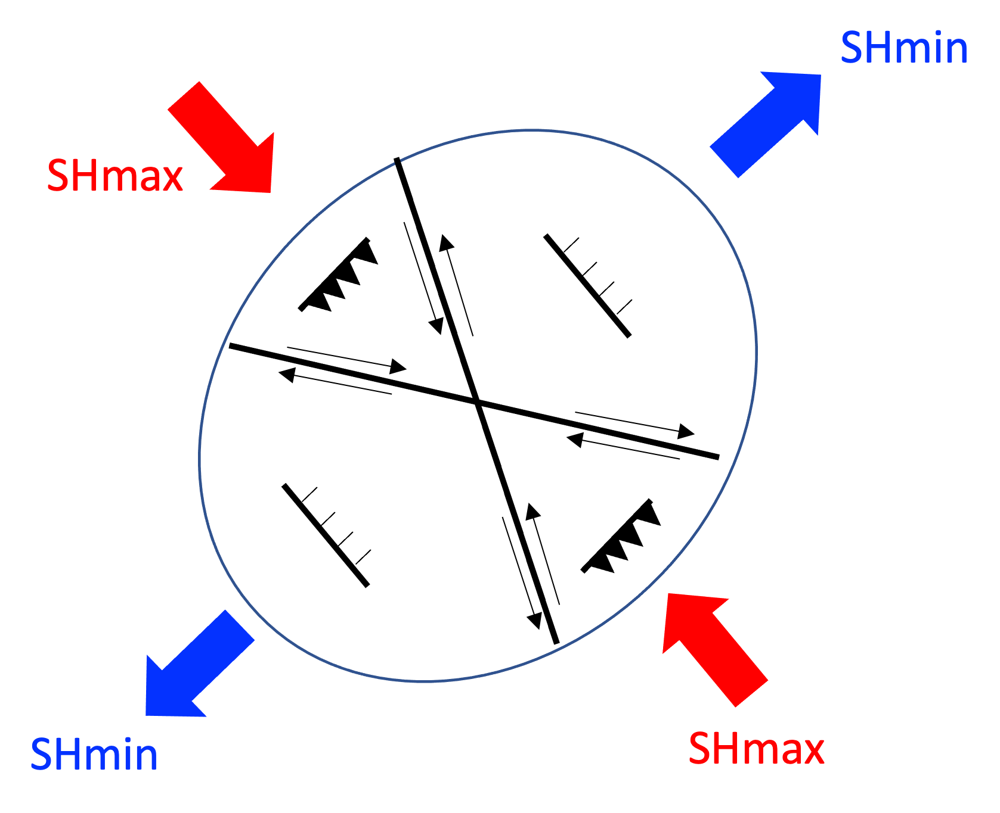

* stress + fault orientation --> slip direction

* Focal mechanism = fault orientation + slip direction --> stress inversion!


Assumption: stress in the same bin is uniform and all focal mechanisms are optimally oriented to fail under the stress

### 1.3.4 hydrothermal, nuclear, and other processes

From Miller, A. D., Foulger, G. R., & Julian, B. R. (1998). Non‐double‐couple earthquakes 2. Observations. Reviews of Geophysics, 36(4), 551-568.

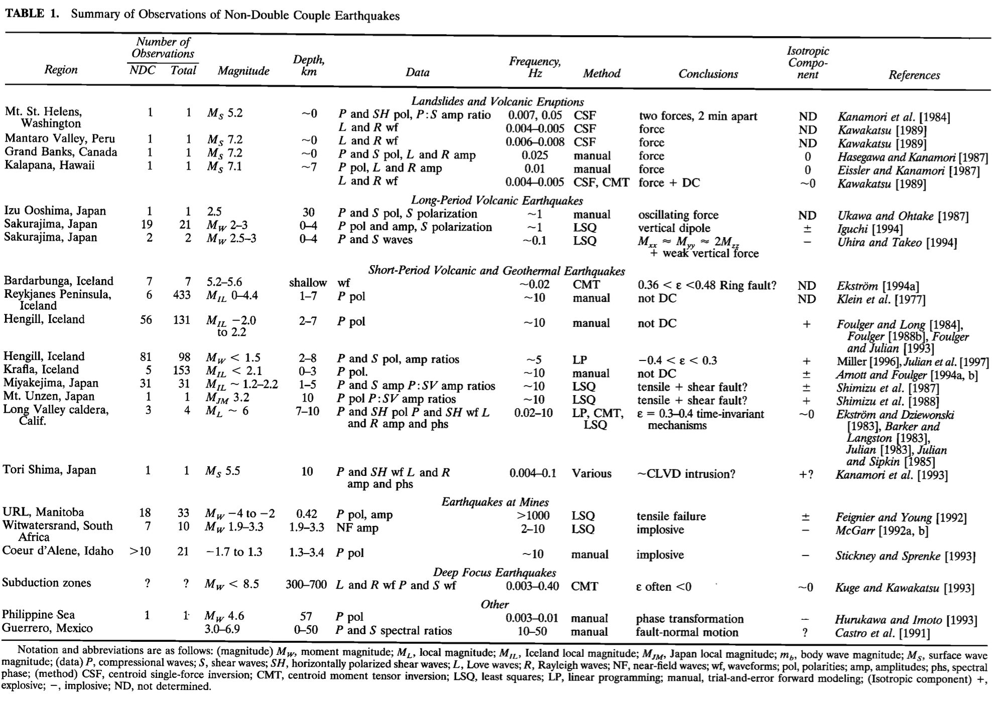

## 2. Moment tensor calculation

## 2.1 Install packages

In [20]:
# install cps for synthesizing green's function
# more documents: https://www.eas.slu.edu/eqc/eqc_cps/getzip.html
%%capture
import os
if not os.path.exists("PROGRAMS.330"):
    !wget "http://www.eas.slu.edu/eqc/eqc_cps/Download/NP330.Oct-26-2023.tgz"
    !tar -xzf NP330.Oct-26-2023.tgz
    %cd PROGRAMS.330
    !./Setup LINUX
    !./C
    %cd ..

## 2.2 Obtain green's functions

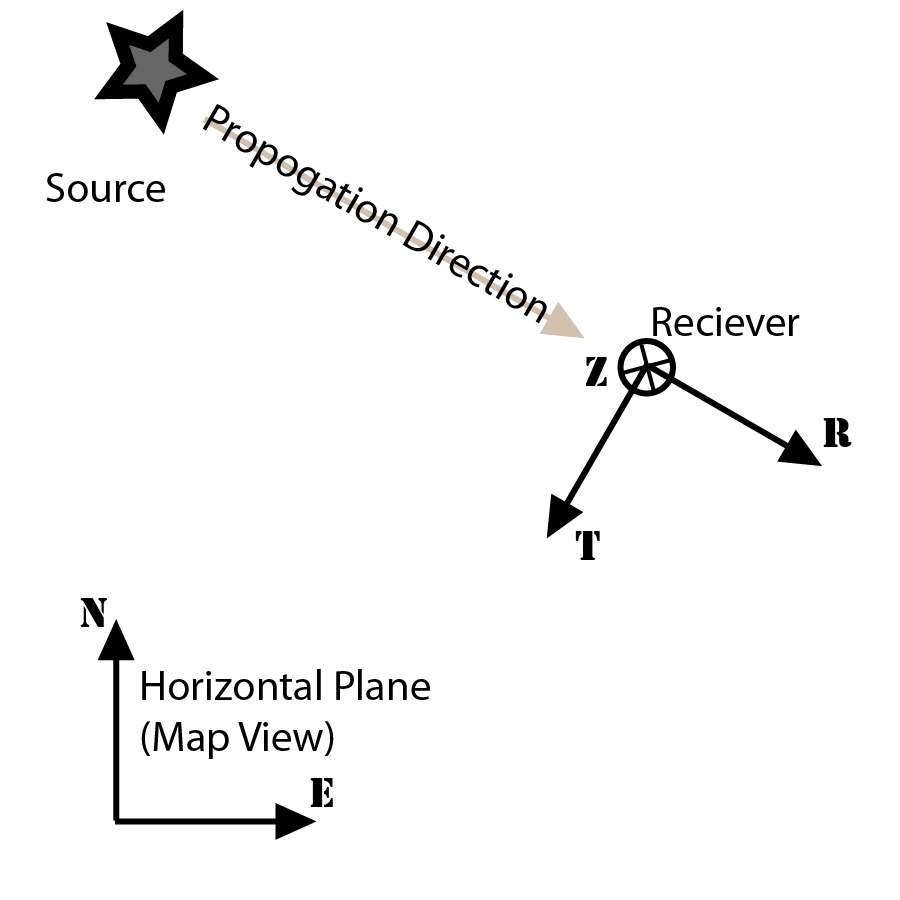

\begin{equation}
u_z = M_{xx}[\,\frac{ZSS}{2}cos(2\alpha z)-\frac{ZDD}{6}+\frac{ZEP}{3}]\, + M_{yy}[\,-\frac{ZSS}{2}cos(2\alpha z)-\frac{ZDD}{6}+\frac{ZEP}{3}]\, + M_{zz}[\,\frac{ZDD}{3}+\frac{ZEP}{3}]\, + M_{xy}[\,{ZSS}sin(2\alpha z)]\,+ M_{xz}[\,{ZDS}cos(\alpha z)]\,+ M_{yz}[\,{ZDS}sin(\alpha z)]\,
\end{equation}
.

.   

\begin{equation}
u_r = M_{xx}[\,\frac{RSS}{2}cos(2\alpha z)-\frac{RDD}{6}+\frac{REP}{3}]\, + M_{yy}[\,-\frac{RSS}{2}cos(2\alpha z)-\frac{RDD}{6}+\frac{REP}{3}]\, + M_{zz}[\,\frac{RDD}{3}+\frac{REP}{3}]\, + M_{xy}[\,{RSS}sin(2\alpha z)]\,+ M_{xz}[\,{RDS}cos(\alpha z)]\,+ M_{yz}[\,{RDS}sin(\alpha z)]\,
\end{equation}
.

.

\begin{equation}
u_t = M_{xx}[\,\frac{TSS}{2}sin(2\alpha z)]\, + M_{yy}[\,-\frac{TSS}{2}sin(2\alpha z)]\, + M_{xy}[\,-{TSS}cos(2\alpha z)]\,+ M_{xz}[\,{TDS}sin(\alpha z)]\,+ M_{yz}[\,-{TDS}cos(\alpha z)]\,
\end{equation}
.

.

𝑢: Surface displacement

𝑆𝑆: vertical strike-slip Green's function

𝐷𝑆: vertical dip-slip Green's function

𝐷𝐷: 45 degrees dip-slip Green's function

𝐸𝑃: explosion Green's function



Equation (6-8) in
Minson, S. E., & Dreger, D. S. (2008). Stable inversions for complete moment tensors. Geophysical Journal International, 174(2), 585-592.

In [3]:
import os
from obspy import read
import matplotlib.pyplot as plt
import numpy as np

path = "./results"
path_bin = 'PROGRAMS.330/bin'

In [4]:
velocity_model = """MODEL.01
GIL7
ISOTROPIC
KGS
FLAT EARTH
1-D
CONSTANT VELOCITY
LINE08
LINE09
LINE10
LINE11
 H(KM)   VP(KM/S)   VS(KM/S) RHO(GM/CC)         QP         QS   ETAP       ETAS      FREFP      FREFS
1.0000       3.20       1.50       2.28     600.00     300.00   0.00       0.00       1.00       1.00
2.0000       4.50       2.40       2.28     600.00     300.00   0.00       0.00       1.00       1.00
1.0000       4.80       2.78       2.58     600.00     300.00   0.00       0.00       1.00       1.00
1.0000       5.51       3.18       2.58     600.00     300.00   0.00       0.00       1.00       1.00
12.000       6.21       3.40       2.68     600.00     300.00   0.00       0.00       1.00       1.00
8.0000       6.89       3.98       3.00     600.00     300.00   0.00       0.00       1.00       1.00
0.0000       7.83       4.52       3.26     600.00     300.00   0.00       0.00       1.00       1.00
"""
with open('gil7.d','w') as f:
    f.write(velocity_model)

dfile = """50 1.00 256 0 0.0
100 1.00 256 0 0.0
150 1.00 256 0 0.0
"""
with open("dfile", 'w') as f:
    f.write(dfile)

In [5]:
model = "gil7"
depths = sorted([5,10,15,20]) # compute GF at 10, 20 km
distances = sorted([50,100,150])
npts = int(256) # number of points in the time series, must be a power of 2
vred = 0 # Reduction velocity in km/sec, 0 sets the reference time to origin time
t0 = int(0) # used to define the first sample point, t0 + distance_in_km/vred

# Filter
freqmin = 0.02
freqmax = 0.05
corners = 3

# Desired sampling interval
dt = 1.0

# time before and after reference time, data will be cut before and after the reference time
time_before = 30
time_after = 200

# green_dir = path + "%s/%s"%('test',model)
green_dir = os.path.join(path, model)
if not os.path.isdir(green_dir):
    os.makedirs(green_dir, exist_ok=True )

In [6]:
!PROGRAMS.330/bin/hprep96 -M gil7.d -d dfile -HS 5.0000 -HR 0 -EQEX
!PROGRAMS.330/bin/hspec96
!PROGRAMS.330/bin/hpulse96 -D -i > file96
!PROGRAMS.330/bin/f96tosac -B file96

      0.0976562     10.0000000
        256         1       129
 ieqex=            0  EARTHQUAKE + EXPLOSION
   10
  TOP  OF MODEL IS FREE SURFACE  
  BASE OF MODEL IS HALFSPACE WITH PROPERTIES OF BOTTOM LAYER
 gil7.d
 LAYER             H      P-VEL     S-VEL   DENSITY  
     1       1.000      3.200      1.500      2.280    
     2       2.000      4.500      2.400      2.280    
     3       1.000      4.800      2.780      2.580    
     4       1.000      5.510      3.180      2.580    
     5       12.00      6.210      3.400      2.680    
     6       8.000      6.890      3.980      3.000    
     7       0.000      7.830      4.520      3.260    
 Working model
        d         a         b         rho      1/qa      1/qb       bsh    1/qbsh
      1.000     3.200     1.500     2.280  0.001667  0.003333     1.500     2.280
      2.000     4.500     2.400     2.280  0.001667  0.003333     2.400     2.280
      1.000     4.800     2.780     2.580  0.001667  0.003333     2.780     

In [7]:
dfile = ("{dist:.0f} {dt:.2f} {npts:d} {t0:d} {vred:.1f}\n")
dfile_out = os.path.join(path,"dfile")

for depth in depths:
    with open(dfile_out,"w") as f:
        for distance in distances:
            f.write(dfile.format(dist=distance,dt=dt,npts=npts,t0=t0,vred=vred))
    # Generate the synthetics
    os.system("cd %s" % (path))
    os.system("PROGRAMS.330/bin/hprep96 -M %s.d -d %s -HS %.4f -HR 0 -EQEX"%(model,dfile_out,depth))
    os.system("PROGRAMS.330/bin/hspec96")
    os.system("PROGRAMS.330/bin/hpulse96 -D -i > file96")
    os.system("PROGRAMS.330/bin/f96tosac -B file96")
    # Filter and save the synthetic Green's functions
    greens = ("ZDD","RDD","ZDS","RDS","TDS","ZSS","RSS","TSS","ZEX","REX")

    for index,distance in enumerate(distances):
        for j,grn in enumerate(greens):
            sacin = "B%03d%02d%s.sac"%(index+1,j+1,grn)
            sacout = "%s/%.0f.%.4f"%(green_dir,distance,depth)
            tmp = read(sacin,format='SAC')
            tmp.filter('bandpass',freqmin=freqmin,freqmax=freqmax,corners=corners,zerophase=True)
            tmp.write("%s.%s"%(sacout,grn),format="SAC") # overwrite

# Uncomment to remove unfiltered synthetic SAC files
os.system("rm B*.sac") # remove the unfiltered SAC files

      0.0976562     10.0000000
        256         1       129
 ieqex=            0  EARTHQUAKE + EXPLOSION
   10
  TOP  OF MODEL IS FREE SURFACE  
  BASE OF MODEL IS HALFSPACE WITH PROPERTIES OF BOTTOM LAYER
 gil7.d
 LAYER             H      P-VEL     S-VEL   DENSITY  
     1       1.000      3.200      1.500      2.280    
     2       2.000      4.500      2.400      2.280    
     3       1.000      4.800      2.780      2.580    
     4       1.000      5.510      3.180      2.580    
     5       12.00      6.210      3.400      2.680    
     6       8.000      6.890      3.980      3.000    
     7       0.000      7.830      4.520      3.260    
 Working model
        d         a         b         rho      1/qa      1/qb       bsh    1/qbsh
      1.000     3.200     1.500     2.280  0.001667  0.003333     1.500     2.280
      2.000     4.500     2.400     2.280  0.001667  0.003333     2.400     2.280
      1.000     4.800     2.780     2.580  0.001667  0.003333     2.780     

0

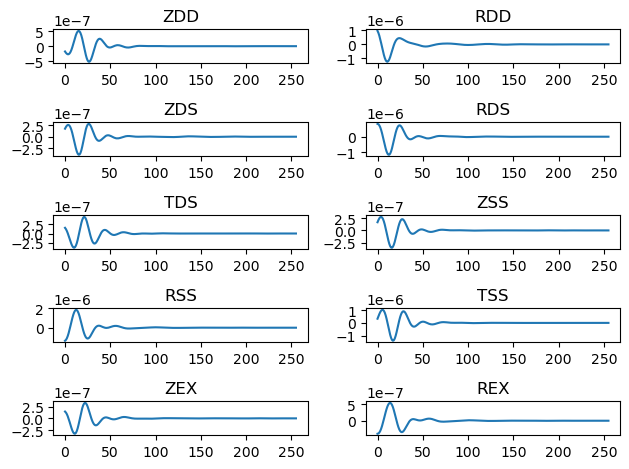

In [8]:
depth = 10
distance = 50


ZDD = read("%s/%.0f.%.4f.%s"%(green_dir,distance,depth,'ZDD'))[0].data
RDD = read("%s/%.0f.%.4f.%s"%(green_dir,distance,depth,'RDD'))[0].data
ZDS = read("%s/%.0f.%.4f.%s"%(green_dir,distance,depth,'ZDS'))[0].data
RDS = read("%s/%.0f.%.4f.%s"%(green_dir,distance,depth,'RDS'))[0].data
TDS = read("%s/%.0f.%.4f.%s"%(green_dir,distance,depth,'TDS'))[0].data
ZSS = read("%s/%.0f.%.4f.%s"%(green_dir,distance,depth,'ZSS'))[0].data
RSS = read("%s/%.0f.%.4f.%s"%(green_dir,distance,depth,'RSS'))[0].data
TSS = read("%s/%.0f.%.4f.%s"%(green_dir,distance,depth,'TSS'))[0].data
ZEX = read("%s/%.0f.%.4f.%s"%(green_dir,distance,depth,'ZEX'))[0].data
REX = read("%s/%.0f.%.4f.%s"%(green_dir,distance,depth,'REX'))[0].data

fig = plt.figure()
plt.subplot2grid((5,2), (0,0))
plt.plot(ZDD)
plt.title('ZDD')
plt.subplot2grid((5,2), (0,1))
plt.plot(RDD)
plt.title('RDD')
plt.subplot2grid((5,2), (1,0))
plt.plot(ZDS)
plt.title('ZDS')
plt.subplot2grid((5,2), (1,1))
plt.plot(RDS)
plt.title('RDS')
plt.subplot2grid((5,2), (2,0))
plt.plot(TDS)
plt.title('TDS')
plt.subplot2grid((5,2), (2,1))
plt.plot(ZSS)
plt.title('ZSS')
plt.subplot2grid((5,2), (3,0))
plt.plot(RSS)
plt.title('RSS')
plt.subplot2grid((5,2), (3,1))
plt.plot(TSS)
plt.title('TSS')
plt.subplot2grid((5,2), (4,0))
plt.plot(ZEX)
plt.title('ZEX')
plt.subplot2grid((5,2), (4,1))
plt.plot(REX)
plt.title('REX')
fig.tight_layout()

## 2.3 Generate synthetic waveforms

In [9]:
def syn_wf(ZDD,RDD,ZDS,RDS,TDS,ZSS,RSS,TSS,ZEX,REX,Mxx,Myy,Mzz,Mxy,Mxz,Myz,az):
    uz = Mxx*(ZSS/2*np.cos(2*az)-ZDD/6+ZEX/3)+ \
          Myy*(-ZSS/2*np.cos(2*az)-ZDD/6+ZEX/3)+ \
          Mzz*(ZDD/3+ZEX/3)+Mxy*ZSS*np.sin(2*az)+ \
          Mxz*ZDS*np.cos(az)+Myz*ZDS*np.sin(az)

    ur = Mxx*(RSS/2*np.cos(2*az)-RDD/6+REX/3)+ \
          Myy*(-RSS/2*np.cos(2*az)-RDD/6+REX/3)+ \
          Mzz*(RDD/3+REX/3)+Mxy*RSS*np.sin(2*az)+ \
          Mxz*(RDS*np.cos(az))+Myz*(RDS*np.sin(az))

    ut = Mxx*(TSS/2*np.sin(2*az))+Myy*(-TSS/2*np.sin(2*az))+ \
          Mxy*(-TSS*np.cos(2*az))+Mxz*(TDS*np.sin(az))+Myz*(-TDS*np.cos(az))
    return uz,ur,ut

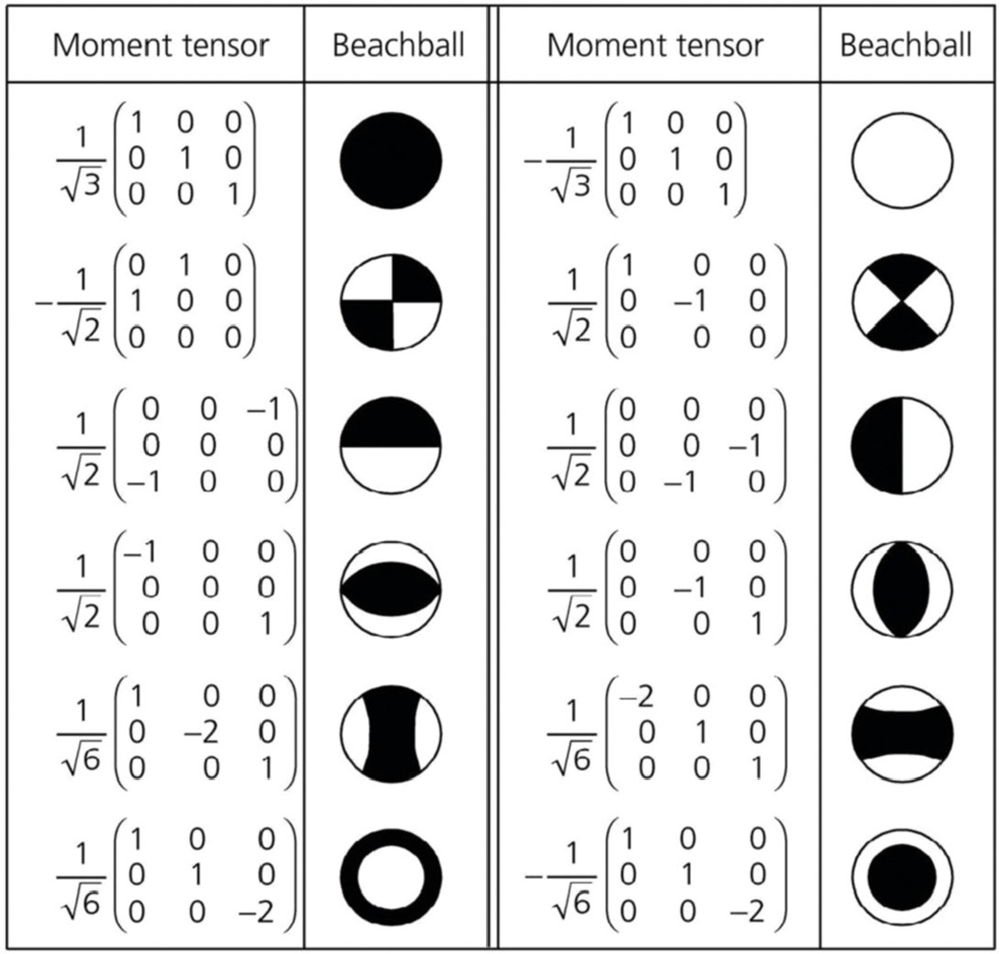

Text(0.5, 1.0, 'ut')

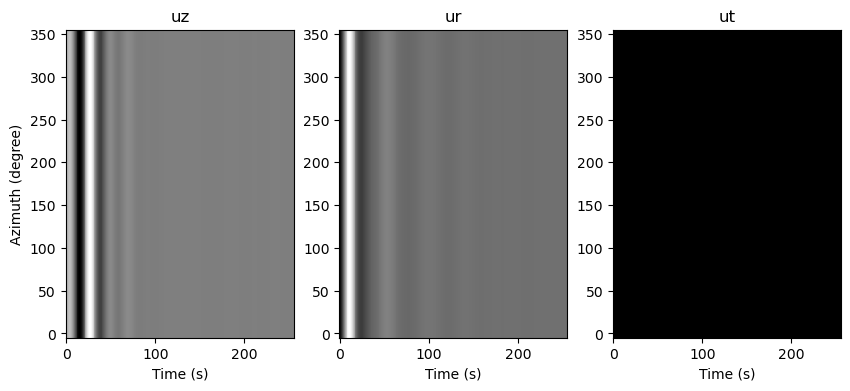

In [10]:
az_all = np.arange(0,360,10)/180*np.pi

uz_all = np.zeros((len(az_all),len(ZDD)))
ur_all = np.zeros((len(az_all),len(ZDD)))
ut_all = np.zeros((len(az_all),len(ZDD)))

#Mxx,Myy,Mzz,Mxy,Mxz,Myz = np.asarray([1,1,1,0,0,0])/np.sqrt(3) # isotropic explosion
#Mxx,Myy,Mzz,Mxy,Mxz,Myz = -np.asarray([0,0,0,1,0,0])/np.sqrt(2) # double couple, strike slip
#Mxx,Myy,Mzz,Mxy,Mxz,Myz = -np.asarray([0,0,0,0,1,0])/np.sqrt(2) # double couple, vertical dip slip
#Mxx,Myy,Mzz,Mxy,Mxz,Myz = np.asarray([-1,0,1,0,0,0])/np.sqrt(2) # double couple, 45 degree dip slip
#Mxx,Myy,Mzz,Mxy,Mxz,Myz = np.asarray([1,-2,1,0,0,0])/np.sqrt(6) # CLVD 1
Mxx,Myy,Mzz,Mxy,Mxz,Myz = np.asarray([1,1,-2,0,0,0])/np.sqrt(6) # CLVD 2

for i in np.arange(len(az_all)):
    uz_all[i,:],ur_all[i,:],ut_all[i,:] = syn_wf(ZDD,RDD,ZDS,RDS,TDS,ZSS,RSS,TSS,ZEX,REX,Mxx,Myy,Mzz,Mxy,Mxz,Myz,az_all[i])

plt.figure(figsize=(10,4))
plt.subplot(131)
plt.pcolormesh(np.arange(len(ZDD)),az_all/np.pi*180,uz_all,cmap='gray')
plt.xlabel('Time (s)')
plt.ylabel('Azimuth (degree)')
plt.title('uz')
plt.subplot(132)
plt.pcolormesh(np.arange(len(ZDD)),az_all/np.pi*180,ur_all,cmap='gray')
plt.xlabel('Time (s)')
plt.title('ur')
plt.subplot(133)
plt.pcolormesh(np.arange(len(ZDD)),az_all/np.pi*180,ut_all,cmap='gray')
plt.xlabel('Time (s)')
plt.title('ut')

**For inversion:**

1. preprocess earthquake waveforms
2. generate green's functions
3. Loop over all possible moment tensors and synthesize waveforms, compare the differences between observed and synthetic waveforms
4. find the best-fitting moment tensor that can explain the observation

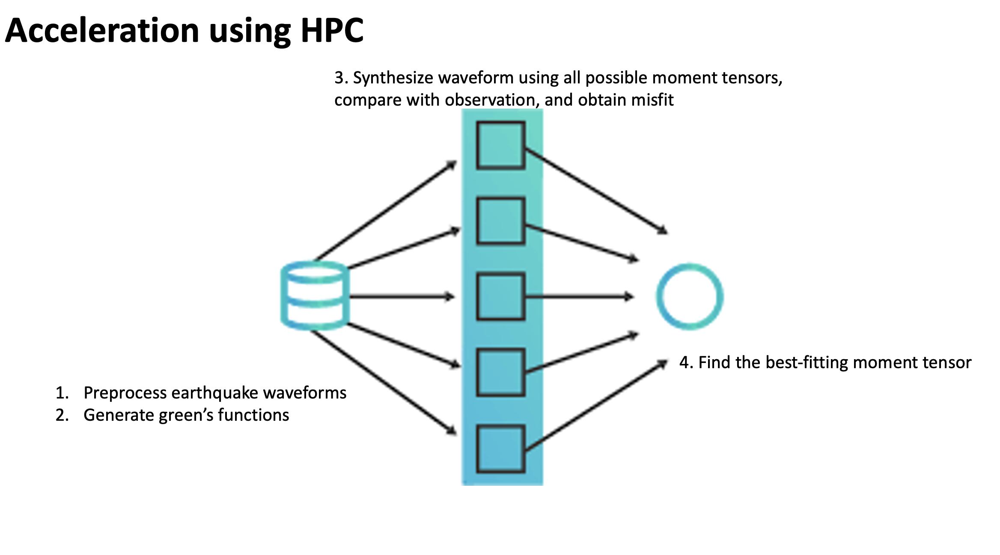

## 3. Focal mechanism

Solving the elastodynamic Green's function G is rather complicated.
If we consider the simple case of a spherical wavefront from an isotropic source, some insight can also be obtained!


## 3.1 Suppose the source-time function is

\begin{equation}
4 \pi \delta (r)f(t)
\end{equation}

The displacement field can be expressed as

\begin{equation}
u(r,t)=(\frac{1}{r^2})f(t-r/ \alpha)+(\frac{1}{r\alpha})(\frac{\partial f(t-r/ \alpha)}{\partial \tau})
\end{equation}

The first term decays as 1/𝑟2 and is called the near-field term since it is important only relatively close to the source.
The second term decays as 1/r and is called the far-field term because it will dominant at large distances from the source.

## 3.2 More complicated point force and double couple sources

\begin{equation}
\boldsymbol{u_i}^p(\boldsymbol{x},t) = \frac{1}{4 \pi \rho \alpha^3}\frac{x_i x_j x_k}{r^3} \frac{1}{r} \dot{M_{jk}}(t-\frac{r}{\alpha})
\end{equation}

Where r^2 = 𝑥1^2 + 𝑥2^2 + 𝑥3^2 is the squared distance to the receiver

\dot{M_0} is the time derivative of the moment tensor.

This is a general expression of the far-field P displacements for any moment tensor representation of the source








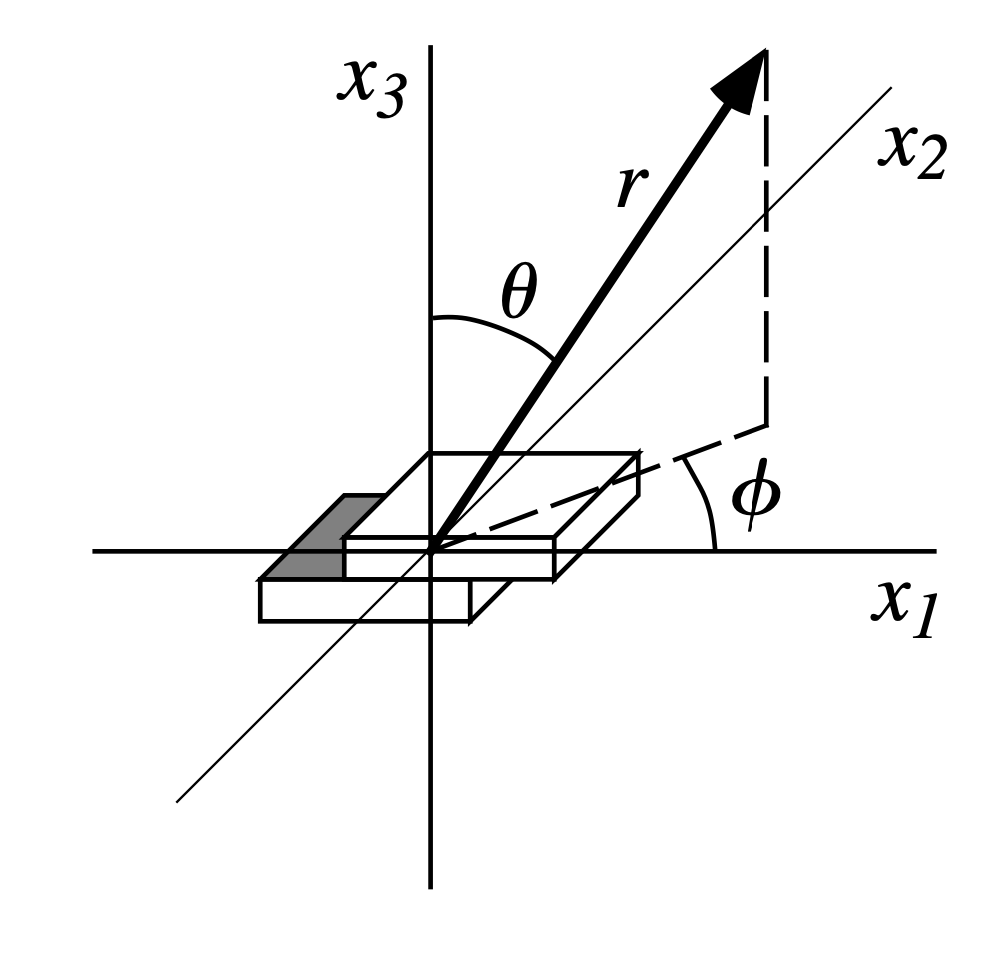

## 3.3 More specific example of a fault described by a double-couple source

fault is in the (x1,x2) plane with motion in the x1 direction, we then have M13 = M31 = M0 and

\begin{equation}
\boldsymbol{u_i}^p(\boldsymbol{x},t) = \frac{1}{2 \pi \rho \alpha^3}\frac{x_i x_1 x_3}{r^3} \frac{1}{r} \dot{M_{0}}(t-\frac{r}{\alpha})
\end{equation}

Substituting x using phi and theta based on
\begin{equation}
x_3/r = cos \theta
\end{equation}

\begin{equation}
x_1/r = sin \theta cos \phi
\end{equation}

\begin{equation}
x_i/r = \hat{r_i}
\end{equation}

We have M13 = M31 = M0

\begin{equation}
\boldsymbol{u}^p = \frac{1}{4 \pi \rho \alpha^3}sin2\theta cos\phi \frac{1}{r}\dot{M_0}(t-\frac{r}{\alpha})\hat{\boldsymbol{r}}
\end{equation}


## 3.4 S wave expression
General expression for far-field S displacements:

\begin{equation}
\boldsymbol{u_i}^S(\boldsymbol{x},t) = \frac{(\delta_{ij}-\gamma_i \gamma_j)\gamma_k}{4 \pi \rho \beta^3}\frac{1}{r} \dot{M_{jk}}(t-\frac{r}{\beta})
\end{equation}

beta is the shear veloity and the direction cosines are 𝛾i = xi/r


For a double-couple source with geometry shown in the figure above, it can be written as

\begin{equation}
\boldsymbol{u_i}^S(\boldsymbol{x},t) = \frac{1}{4 \pi \rho \beta^3}(cos 2\theta cos \phi \boldsymbol{\hat{\theta}}-cos\theta sin\phi \boldsymbol{\hat{\phi}})\frac{1}{r} \dot{M_{0}}(t-\frac{r}{\beta})
\end{equation}

## 3.5 visualization of waveform features

In [11]:
def P_S_pol_amp(theta,phi):
    # P wave amplitude
    P_amp = abs(np.sin(2*theta)*np.cos(phi))
    P_pol = np.sign(np.sin(2*theta)*np.cos(phi))
    # S wave amplitude
    s1 = np.cos(2*theta)*np.cos(phi)
    s2 = -np.cos(theta)*np.sin(phi)
    S_amp = np.sqrt(s1*s1+s2*s2)
    return P_pol, P_amp, S_amp


theta_all = np.arange(0,360,5)/180*np.pi
phi_all = np.arange(0,180,5)/180*np.pi

P_amp_all = np.zeros((len(theta_all),len(phi_all)))
S_amp_all = np.zeros((len(theta_all),len(phi_all)))
P_pol_all = np.zeros((len(theta_all),len(phi_all)))

for itheta in np.arange(len(theta_all)):
    for iphi in np.arange(len(phi_all)):
        P_pol_all[itheta,iphi],P_amp_all[itheta,iphi],S_amp_all[itheta,iphi] =P_S_pol_amp(theta_all[itheta],phi_all[iphi])

/var/folders/gc/lpnp82h92tv35c_7v97w97cm0000gn/T/ipykernel_5711/3513014322.py:18: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(theta_all/np.pi*180,phi_all/np.pi*180,np.log10(P_amp_all/S_amp_all).T,cmap='jet',vmin=-2,vmax=2)


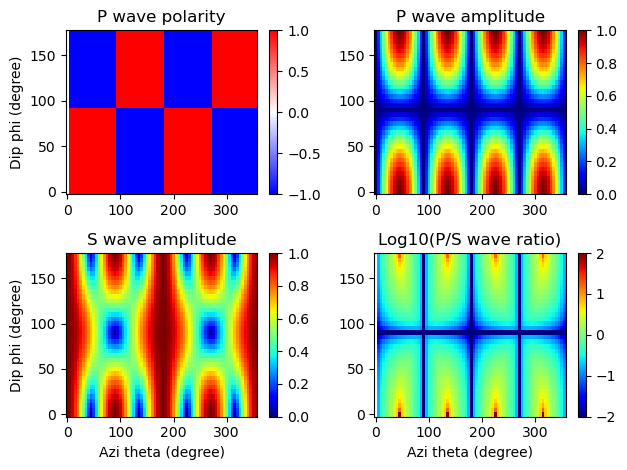

In [12]:
fig = plt.figure()
plt.subplot(221)
plt.pcolormesh(theta_all/np.pi*180,phi_all/np.pi*180,P_pol_all.T,cmap='bwr')
plt.colorbar()
plt.ylabel('Dip phi (degree)')
plt.title('P wave polarity')
plt.subplot(222)
plt.pcolormesh(theta_all/np.pi*180,phi_all/np.pi*180,P_amp_all.T,cmap='jet')
plt.colorbar()
plt.title('P wave amplitude')
plt.subplot(223)
plt.pcolormesh(theta_all/np.pi*180,phi_all/np.pi*180,S_amp_all.T,cmap='jet')
plt.colorbar()
plt.ylabel('Dip phi (degree)')
plt.xlabel('Azi theta (degree)')
plt.title('S wave amplitude')
plt.subplot(224)
plt.pcolormesh(theta_all/np.pi*180,phi_all/np.pi*180,np.log10(P_amp_all/S_amp_all).T,cmap='jet',vmin=-2,vmax=2)
plt.colorbar()
plt.xlabel('Azi theta (degree)')
plt.title('Log10(P/S wave ratio)')
fig.tight_layout()

**For inversion:**

1. measure polarity and amplitude ratio from earthquake waveforms
2. synthesize polarity and amplitude ratio for a double-couple source
3. rotate the synthesized waveform features to all possible strike, dip and rake
4. find the best-fitting focal mechanism that can best explain all observations

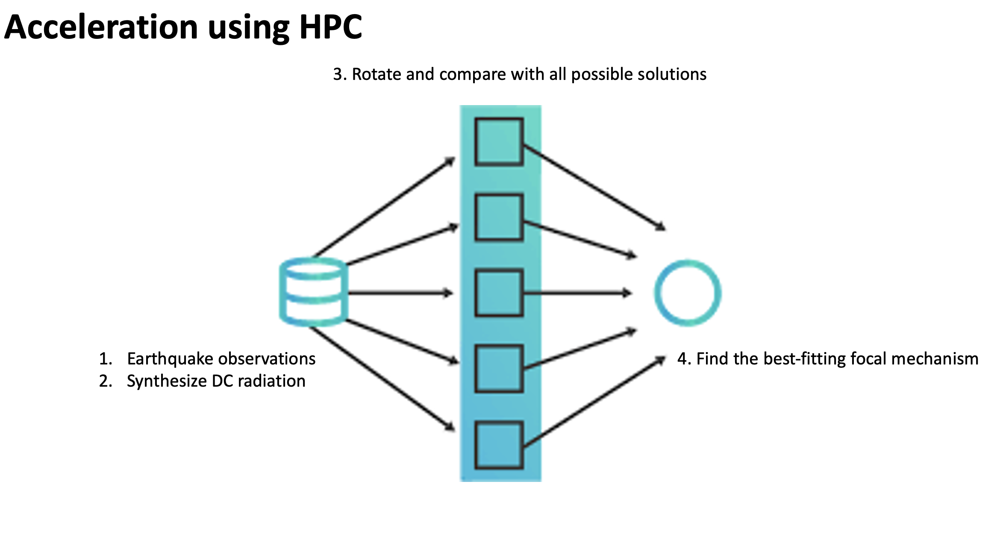

## 4. Download and visualize earthquake information



In [13]:
from obspy.clients.fdsn import Client
from obspy import read_events, UTCDateTime
from obspy.clients.fdsn.mass_downloader import CircularDomain, Restrictions, MassDownloader
import os


## 4.1 Obtain earthquake basic information


In [14]:
event_bool = True

if event_bool:
    dataCenter="IRIS"
    client = Client(dataCenter)
    starttime = UTCDateTime("2019-07-16T00:00:00")
    endtime = UTCDateTime("2019-07-16T23:59:59")
    catalog = client.get_events(starttime=starttime, endtime=endtime,
                        minmagnitude=4,maxmagnitude=5,
                        minlatitude=36, maxlatitude=38,
                        minlongitude=-122, maxlongitude=-120)

## 4.2 Obtain earthquake phase information



*   Southern California: use STP

```
PHASE –f 10167485.phase -e 10167485
```




*  Northern California: use FTP


```
https://ncedc.org/ftp/pub/catalogs/ncss/hypoinverse/phase2k/
```





## 4.3 Download waveform

In [15]:
dataCenter="NCEDC"

# Time before and after event origin for waveform segments
time_before = 60
time_after = 300
download_bool = True

#obtain event information
event = catalog[0]
evid = str(event.origins[0].resource_id).split("=")[-1]
evorigin = event.preferred_origin().time
evlo = event.preferred_origin().longitude
evla = event.preferred_origin().latitude
evdep = event.preferred_origin().depth # in meters
evmag = event.preferred_magnitude().mag
auth = event.preferred_origin().extra.catalog.value.replace(" ","")
# setup waveform download criteria
starttime = evorigin - time_before
endtime = evorigin + time_after

domain = CircularDomain(latitude=evla, longitude=evlo, minradius=0.7, maxradius=1.3)
restrictions = Restrictions(starttime=starttime, endtime=endtime,
        reject_channels_with_gaps=True,
        minimum_length=0.95,
        network="BK",
        channel_priorities=["BH[ZNE12]", "HH[ZNE12]"],
        sanitize=True)

# Dowanload waveforms and metadata
event_dir = path+evid
if not os.path.isdir(event_dir):
    os.mkdir(event_dir)
if download_bool:
    mseed_storage = "%s/waveforms"%event_dir
    stationxml_storage = "%s/stations"%event_dir
    mdl = MassDownloader(providers=[dataCenter])
    mdl_helper = mdl.download(domain, restrictions,
        mseed_storage=mseed_storage,stationxml_storage=stationxml_storage)
    print("%s download completed"%event_dir)


[2023-10-28 11:01:42,699] - obspy.clients.fdsn.mass_downloader - INFO: Initializing FDSN client(s) for NCEDC.
[2023-10-28 11:01:42,771] - obspy.clients.fdsn.mass_downloader - INFO: Successfully initialized 1 client(s): NCEDC.
[2023-10-28 11:01:42,773] - obspy.clients.fdsn.mass_downloader - INFO: Total acquired or preexisting stations: 0
[2023-10-28 11:01:42,773] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NCEDC' - Requesting unreliable availability.
[2023-10-28 11:01:44,703] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NCEDC' - Successfully requested availability (1.93 seconds)
[2023-10-28 11:01:44,727] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NCEDC' - Found 13 stations (39 channels).
[2023-10-28 11:01:44,727] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NCEDC' - Will attempt to download data from 13 stations.
[2023-10-28 11:01:44,729] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NCEDC' - Status for 39 time intervals/channels before download

./results40191336 download completed


### 4.4 waveform preprocessing

In [16]:
from obspy import read, read_inventory, UTCDateTime
from obspy.geodetics.base import gps2dist_azimuth
from obspy.core.util.attribdict import AttribDict

pre_filt = (0.004,0.007,10,20)
sac_dir = "%s/sac"%event_dir # Output directory
if not os.path.isdir(sac_dir):
    os.mkdir(sac_dir)
# Read response files
inv = read_inventory("%s/stations/*"%event_dir,format='STATIONXML')
# Read data
st = read("%s/waveforms/*"%event_dir,format='MSEED')
# Detrend and remove instrument response
st.detrend(type="linear") # equivalent to rtr in SAC
st.remove_response(inventory=inv, pre_filt=pre_filt, output="DISP", zero_mean=True) # correct to displacement
st.detrend(type="linear")
st.detrend(type="demean") # remove mean
# Define SAC headers and calculate back-azimtuh for rotation
origin_time = UTCDateTime(evorigin)
depth = evdep*1000
for tr in st:
    meta = inv.get_channel_metadata(tr.id)
    dist, az, baz = gps2dist_azimuth(evla,evlo,meta['latitude'],meta['longitude'])
    omarker = origin_time - tr.stats.starttime
    # Obspy trace headers
    tr.stats.distance = dist
    tr.stats.back_azimuth = baz
    # SAC headers
    sacd = AttribDict()
    sacd.stla = meta['latitude']
    sacd.stlo = meta['longitude']
    sacd.stel = meta['elevation']
    sacd.evla = evla
    sacd.evlo = evlo
    sacd.evdp = evdep # in meters
    sacd.az = az
    sacd.baz = baz
    sacd.dist = dist/1000 # convert to kilometers
    sacd.o = 0
    sacd.b = -1*omarker
    tr.stats.sac = sacd
# Rotate to ZNE
st._rotate_to_zne(inv,components=("ZNE","Z12"))
# Get station names
netstaloccha = sorted(set(
            [(tr.stats.network, tr.stats.station, tr.stats.location, tr.stats.channel[:-1]) for tr in st]
            ))
# Keep only three-component seismograms, then rotate horizontals to RT
for net, sta, loc, cha in netstaloccha:
    traces = st.select(network=net,station=sta,location=loc,channel="%s[ZNE]"%cha)
    if len(traces) != 3:
        for tr in traces:
            st.remove(tr)
    else:
        traces.rotate(method="NE->RT")

# Update station names
netstaloccha = set(
        [(tr.stats.network, tr.stats.station, tr.stats.location, tr.stats.channel[:-1], "ZRT",
          tr.stats.sac.dist, tr.stats.sac.az, tr.stats.sac.stlo, tr.stats.sac.stla) for tr in st.select(component="Z")]
    )
# save the data in SAC format
print("Saving instrument corrected data to %s."%sac_dir)
for tr in st:
    tr.write("%s/%s"%(sac_dir,tr.id),format="SAC")

Saving instrument corrected data to ./results40191336/sac.


## 4.5 Waveform visualization

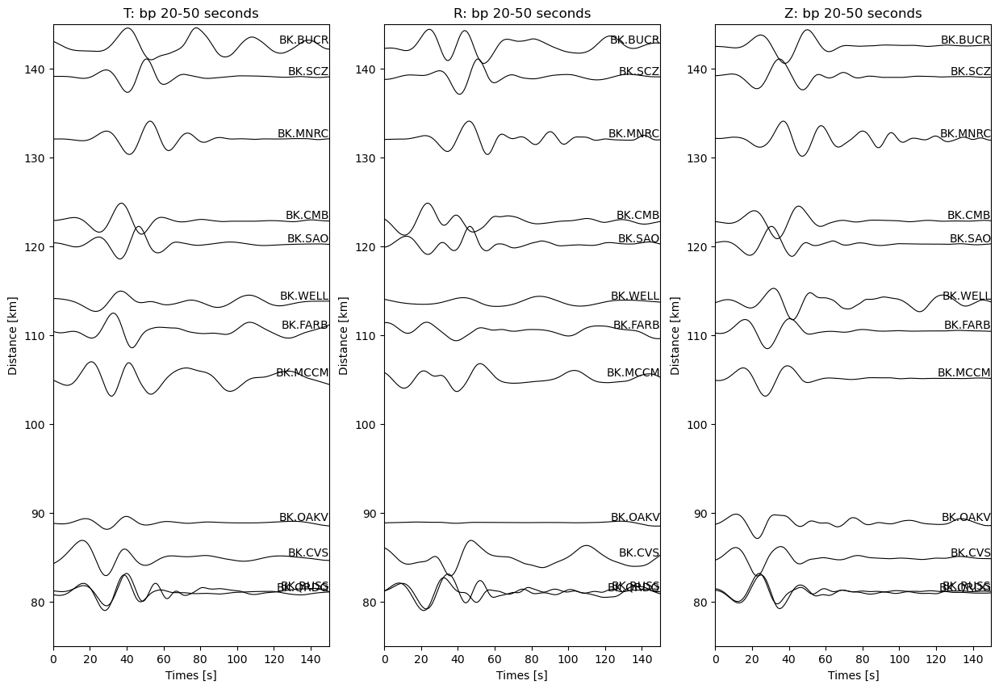

In [17]:
import matplotlib.pyplot as plt

freqmin = 0.02
freqmax = 0.05
corners = 2
st_filt = st.copy()

# Apply filter and taper the edges
st_filt.filter("bandpass",freqmin=freqmin,freqmax=freqmax,corners=corners,zerophase=True)
st_filt.taper(max_percentage=0.05)

# Each seismogram is normalized against each trace
xmin = 0
xmax = 150
ymin = 75
ymax = 145
scale = 2 # scale the traces
fig, axes = plt.subplots(1,3,figsize=(15,10))
for component, ax in zip(("T","R","Z"),axes):
    for tr in st_filt.select(component=component):
        times = tr.times() - (origin_time - tr.stats.starttime)
        tr.data /= max(abs(tr.data))
        tr.data *= scale
        ax.plot(times,tr.data+tr.stats.sac.dist,color="black",linewidth=0.8)
        ax.text(xmax,tr.stats.sac.dist,"%s.%s"%(tr.stats.network,tr.stats.station),va="bottom",ha="right")
    ax.set_xlim(xmin,xmax)
    ax.set_ylim(ymin,ymax)
    ax.set_xlabel("Times [s]")
    ax.set_ylabel("Distance [km]")
    ax.set_title("%s: bp %.0f-%.0f seconds"%(component,1/freqmax,1/freqmin))

## 5. Related packages

## Package for moment tensor inversion
https://github.com/LLNL/mttime/tree/master

## Package for focal mechanism calculation

https://github.com/cecece08/REFOC-and-HASH/tree/main

## Package for stress inversion

https://www.ig.cas.cz/en/stress-inverse/
